## version3: 10/25 –

### Library

In [1]:
# import libraries
import os
import math
import time
import yaml
import datetime 
import numpy as np
import pandas as pd
from tqdm import trange
from tqdm.notebook import tqdm

import seaborn as sns
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error

import torch
import torch.nn as nn
from torch.nn import LayerNorm
from torch.utils.data import Dataset, DataLoader
from torch.nn import TransformerEncoder, TransformerDecoder, TransformerEncoderLayer, TransformerDecoderLayer

# set random seed
fix_seed = 1111
np.random.seed(fix_seed)
torch.manual_seed(fix_seed)

# set device 
device = torch.device('mps' if torch.backends.mps.is_available() else 'cpu')
print(device)

mps


### Import parameters and data

In [2]:
# load parameters
with open('/Users/koki/PycharmProjects/MasterThesis/params/config_transformer.yml', 'r') as yml:
    yaml_data = yaml.safe_load(yml)

In [3]:
# import data
df = pd.read_csv('/Users/koki/PycharmProjects/MasterThesis/data/preprocessed/201601to202309_10areas_for_analysis.csv')
df['datetime'] = pd.to_datetime(df['datetime'])
df = df.set_index('datetime')

# # covid dummy
# covid_1 = pd.date_range(start='2020-03-01', end='2020-05-30 21:00', freq='3h')  # 第1波
# covid_2 = pd.date_range(start='2020-11-01', end='2021-04-30 21:00', freq='3h')  # 第3波, 第4波
# covid_3 = pd.date_range(start='2021-07-01', end='2021-09-30 21:00', freq='3h')  # 第5波
# covid_4 = pd.date_range(start='2021-12-01', end='2022-03-31 21:00', freq='3h')  # 第6波(オミクロン株の拡大)
# covid = covid_1.union(covid_2).union(covid_3).union(covid_4)
# df['covid'] = df.index.map(lambda d: int(d in covid))

### Define dataset

In [4]:
class SequenceDataset(Dataset):
    def __init__(self, dataframe, seq_len_src=56, seq_len_tgt=8, lag_len=8):
        self.seq_len_src = seq_len_src
        self.lag_len = lag_len
        self.seq_len_tgt = seq_len_tgt
        self.df = torch.tensor(dataframe.values).float()
        self.len = math.floor((len(self.df) - self.seq_len_src - self.seq_len_tgt) / self.lag_len) + 1

    def __len__(self):
        return self.len

    def __getitem__(self, i):
        if type(i) == slice:
            raise Exception('Exception: Expected int, inputted slice!')
            
        X = self.df[i*self.lag_len:i*self.lag_len+self.seq_len_src]
        Y = self.df[i*self.lag_len+self.seq_len_src:i*self.lag_len+self.seq_len_src+self.seq_len_tgt]
        
        return X, Y
    
    def input_size(self):
        return self.df.shape[1]

### Split data

In [5]:
batch_size = yaml_data['dataset']['batch_size']
seq_len_src = yaml_data['dataset']['seq_len_src']
seq_len_tgt = yaml_data['dataset']['seq_len_tgt']
lag_len = yaml_data['dataset']['lag_len']

# set start dates and end dates
train_start = yaml_data['dataset']['train_start']
train_end = yaml_data['dataset']['train_end']
valid_start = yaml_data['dataset']['valid_start']
valid_end = yaml_data['dataset']['valid_end']
test_start = yaml_data['dataset']['test_start']
test_end = yaml_data['dataset']['test_end']

# split df into train, valid and test data
df_train = df.loc[train_start:train_end].copy()
df_valid = df.loc[valid_start:valid_end].copy()
df_test = df.loc[test_start:test_end].copy()

# # choose hours to use
# time_list = yaml_data['dataset']['time_list']
# if time_list != 'all':
#     df = df.loc[df.index.hour.isin(time_list)]

# df for prediction
df_valid_for_pred = pd.concat([df_train.iloc[-seq_len_src:, :], df_valid])  # valid_dataの1期目から予測するために、前日もテストデータに含める。
df_test_for_pred = pd.concat([df_valid.iloc[-seq_len_src:, :], df_test])  # test_dataの1期目から予測するために、前日もテストデータに含める。

# print the fraction of each dataset
print("Train set fraction: {:.3f}%".format(len(df_train)/len(df)*100))
print("Valid set fraction: {:.3f}%".format(len(df_valid)/len(df)*100))
print("Test set fraction: {:.3f}%".format(len(df_test)/len(df)*100))

Train set fraction: 77.456%
Valid set fraction: 12.898%
Test set fraction: 9.647%


### Set dataloader

In [6]:
# create dataset
train_dataset = SequenceDataset(df_train, seq_len_src=56, seq_len_tgt=8, lag_len=1)
valid_dataset = SequenceDataset(df_valid, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset = SequenceDataset(df_test, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

# dataset for prediction
valid_dataset_for_pred = SequenceDataset(df_valid_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)
test_dataset_for_pred = SequenceDataset(df_test_for_pred, seq_len_src=seq_len_src, seq_len_tgt=seq_len_tgt, lag_len=lag_len)

print("Length of each dataset:")
print("    Train:{}, Valid:{}, Test:{}".format(len(train_dataset), len(valid_dataset), len(test_dataset)))

# create dataloader
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, drop_last=False, num_workers=0, pin_memory=True)
# valid_loader = DataLoader(valid_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)
# test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, drop_last=False, num_workers=0, pin_memory=True)

# check the shape of a batch
X, y = next(iter(train_loader))
print("Features shape:", X.shape)  # [batch size, sequence length, number of features]
print("Target shape:", y.shape)

Length of each dataset:
    Train:17473, Valid:358, Test:266
Features shape: torch.Size([16, 56, 66])
Target shape: torch.Size([16, 8, 66])


### Define embedding

In [7]:
#位置エンコーディングの定義
class PositionalEncoding(nn.Module):
    def __init__(self, d_model, dropout: float = 0.1, max_len: int = 5000) -> None:
        super(PositionalEncoding, self).__init__()
        self.dropout = nn.Dropout(p=dropout)
        self.d_model = d_model

        pe = torch.zeros(max_len, d_model)
        position = torch.arange(0, max_len, dtype=torch.float).unsqueeze(1)
        div_term = torch.exp(torch.arange(0, d_model, 2).float() * (-math.log(10000.0) / d_model))
        pe[:, 0::2] = torch.sin(position * div_term)
        pe[:, 1::2] = torch.cos(position * div_term)
        pe = pe.unsqueeze(0)
        self.register_buffer('pe', pe)

    def forward(self, x):
        x = x + self.pe[:, :x.size(1)]
        return self.dropout(x)

### Define Transformer

In [8]:
class Transformer(nn.Module):
    def __init__(self, num_encoder_layers, num_decoder_layers,
        d_model, d_output,
        dim_feedforward = 512, dropout = 0.1, nhead = 8):
        
        super(Transformer, self).__init__()
        
        self.positional_encoding = PositionalEncoding(d_model, dropout=dropout)
        
        #エンコーダの定義
        encoder_layer = TransformerEncoderLayer(d_model=d_model, 
                                                nhead=nhead, 
                                                dim_feedforward=dim_feedforward,
                                                dropout=dropout,
                                                batch_first=True,
                                                activation='gelu'
                                               )
        encoder_norm = LayerNorm(d_model)
        self.transformer_encoder = TransformerEncoder(encoder_layer, 
                                                      num_layers=num_encoder_layers,
                                                      norm=encoder_norm
                                                     )
        
        #デコーダの定義
        decoder_layer = TransformerDecoderLayer(d_model=d_model, 
                                                nhead=nhead, 
                                                dim_feedforward=dim_feedforward,
                                                dropout=dropout,
                                                batch_first=True,
                                                activation='gelu'
                                               )
        decoder_norm = LayerNorm(d_model)
        self.transformer_decoder = TransformerDecoder(decoder_layer, 
                                                      num_layers=num_decoder_layers, 
                                                      norm=decoder_norm)
        
        #出力層の定義
        self.output = nn.Linear(d_model, d_output)
        

    def forward(self, src, tgt, mask_src, mask_tgt):
        #mask_src, mask_tgtはセルフアテンションの際に未来のデータにアテンションを向けないためのマスク
        
        embedding_src = self.positional_encoding(src)
        memory = self.transformer_encoder(embedding_src, mask_src)
        
        embedding_tgt = self.positional_encoding(tgt)
        outs = self.transformer_decoder(embedding_tgt, memory, mask_tgt)
        
        output = self.output(outs)
        return output

    def encode(self, src, mask_src):
        return self.transformer_encoder(self.positional_encoding(src), mask_src)

    def decode(self, tgt, memory, mask_tgt):
        return self.transformer_decoder(self.positional_encoding(tgt), memory, mask_tgt)


### Define masks

In [9]:
def create_mask(src, tgt):
    
    seq_len_src = src.shape[1]
    seq_len_tgt = tgt.shape[1]

    mask_tgt = generate_square_subsequent_mask(seq_len_tgt).to(device)
    mask_src = generate_square_subsequent_mask(seq_len_src).to(device)

    return mask_src, mask_tgt


def generate_square_subsequent_mask(seq_len):
    mask = torch.triu(torch.full((seq_len, seq_len), float('-inf')), diagonal=1)
    return mask


### Define training, validation, and prediction

In [10]:
def train(model, data_loader, optimizer, criterion, num_features_pred):
    model.train()
    total_loss = []
    for src, tgt in data_loader:
        
        src = src.float().to(device)
        tgt = tgt.float().to(device)

        input_tgt = torch.cat((src[:,-1:,:],tgt[:,:-1,:]), dim=1)
        
        mask_src, mask_tgt = create_mask(src, input_tgt)
        
        output = model(src=src, tgt=input_tgt, mask_src=mask_src, mask_tgt=mask_tgt)
        
        optimizer.zero_grad()
        
        loss = criterion(output[:,:,0:num_features_pred], tgt[:,:,0:num_features_pred])
        
        loss.backward()
        total_loss.append(loss.cpu().detach())
        optimizer.step()
    
    # change learning rate
    scheduler.step()
        
    return np.average(total_loss)


def predict(model, dataset, num_features_pred):
    model.eval()
    with torch.no_grad():
        all_outputs = torch.zeros(1, 1, df.shape[1]).to(device)
        for t in tqdm(range(len(dataset))):  # (len(df_test)-8)/8 = 92回予測が必要
            src = dataset[t][0].float().to(device)
            tgt = dataset[t][1].float().to(device)

            # add a batch size of 1 for the encoder (= [1, :, :])
            src = src.unsqueeze(0)  
            tgt = tgt.unsqueeze(0)

            seq_len_src = src.shape[1]
            seq_len_tgt = tgt.shape[1]
            
            mask_src = (torch.zeros(seq_len_src, seq_len_src)).type(torch.bool)
            mask_src = mask_src.float().to(device)
            
            memory = model.encode(src, mask_src)
            outputs = src[:, -1:, :]

            #ループさせて逐次的に予測する
            for i in range(seq_len_tgt):

                mask_tgt = (generate_square_subsequent_mask(outputs.size(1))).to(device)

                output = model.decode(outputs, memory, mask_tgt)
                output = model.output(output)  # output.shape = [バッチサイズ1, ウィンドウサイズi(累積される), 変数]

                # convert predicted dummies to the actual ones
                output = torch.cat([output[:, -1:, :num_features_pred], tgt[:, i:i+1, num_features_pred:]], dim=2)

                # concat outputs and output above
                outputs = torch.cat([outputs, output], dim=1)
                
            all_outputs = torch.cat([all_outputs, outputs[:, 1:, :]], dim=1)

    return all_outputs[-1, 1:, :num_features_pred].to('cpu').detach().numpy()  # all_outputs[-1, 1:, :num_features_pred] → バッチサイズを消す＆all_outputsの最初の0を消す

### Define parameters

In [11]:
# d_input = 1
d_output = train_dataset.input_size()
d_model = train_dataset.input_size()
nhead = yaml_data['model']['nhead'] 
dim_feedforward = yaml_data['model']['dim_feedforward']
num_encoder_layers = yaml_data['model']['num_encoder_layers']
num_decoder_layers = yaml_data['model']['num_decoder_layers']
dropout = yaml_data['model']['dropout']
epochs = yaml_data['training']['n_epochs']
learning_rate = yaml_data['training']['learning_rate']
num_features_pred=yaml_data['training']['num_features_pred']
milestones = yaml_data['training']['milestones']
gamma = yaml_data['training']['gamma']

model = Transformer(num_encoder_layers=num_encoder_layers,
                    num_decoder_layers=num_decoder_layers,
                    d_model=d_model,
                    d_output=d_output,
                    dim_feedforward=dim_feedforward,
                    dropout=dropout, nhead=nhead)

# for p in model.parameters():
#     if p.dim() > 1:
#         nn.init.xavier_uniform_(p)

model = model.to(device)
criterion = torch.nn.MSELoss().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
scheduler = torch.optim.lr_scheduler.MultiStepLR(optimizer, milestones=milestones, gamma=gamma)

### Training

In [12]:
start = time.time()
train_losses = []
with trange(epochs) as tr:
    for epoch in tr:
        # train
        loss_train = train(model=model, 
                           data_loader=train_loader, 
                           optimizer=optimizer,
                           criterion=criterion, 
                           num_features_pred=num_features_pred)
        # convert to RMSE
        loss_train = math.sqrt(loss_train)
        # append epoch loss
        train_losses.append(loss_train)  
        # progress bar 
        tr.set_postfix(Train_loss="{0:.3f}".format(loss_train))

# calculate execution time
end = time.time()
t = math.floor(end-start)
elapsed_hour = t // 3600
elapsed_minute = (t % 3600) // 60
elapsed_second = (t % 3600 % 60)
elapsed_time = str(elapsed_hour).zfill(2) + ":" + str(elapsed_minute).zfill(2) + ":" + str(elapsed_second).zfill(2)

100%|████████████████████████████████████████████████████████████████████████████████████████████████| 200/200 [3:03:14<00:00, 54.97s/it, Train_loss=12949.551]


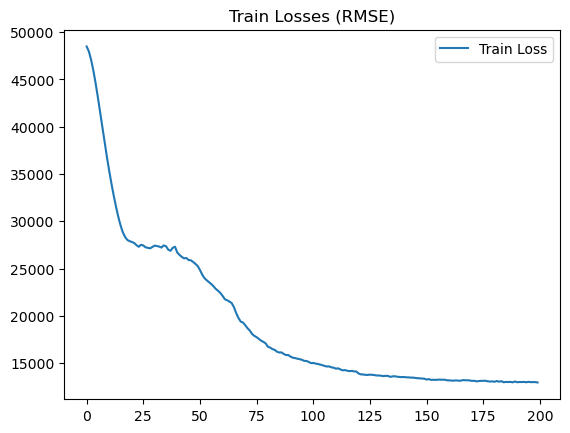

In [13]:
plt.plot(train_losses, label='Train Loss')
plt.title('Train Losses (RMSE)')
plt.legend()
plt.show()

### (Load a past model)

In [14]:
'''
This code is used only for loading the model and checking its prediction.
'''
# # set name of the model
# model_num = 20

# # load the model and its loss
# model = torch.load('/Users/koki/PycharmProjects/MasterThesis/models/model_' + str(model_num).zfill(2) + '.pth')
# loss = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='losses', usecols=[model_num-1])
# train_losses = loss.iloc[:,0].to_list()

'\nThis code is used only for loading the model and checking its prediction.\n'

### Predict

In [17]:
num_features_pred = yaml_data['training']['num_features_pred']

# make y_pred df
pred_val = predict(model = model, dataset = valid_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_val = pd.DataFrame(pred_val, columns=df.columns[:num_features_pred], index=df_valid.index).add_prefix('pred_')

  0%|          | 0/365 [00:00<?, ?it/s]

### Calculate RMSE and MAE (predicted values and actual values)

In [18]:
rmse, mae = {}, {}
for i in range(y_pred_val.shape[1]):
    rmse[df.columns[i]] = mean_squared_error(df_valid.iloc[:,i], y_pred_val.iloc[:,i], squared=False)
    mae[df.columns[i]] = mean_absolute_error(df_valid.iloc[:,i], y_pred_val.iloc[:,i])

rmse_pre_actu = pd.Series(rmse)
mae_pre_actu = pd.Series(mae)

print('------------RMSE------------')
print(rmse_pre_actu)
print('Average :', np.mean(rmse_pre_actu))
print('------------MAE-------------')
print(mae_pre_actu)
print('Average :', np.mean(mae_pre_actu))

------------RMSE------------
渋谷駅_total      60561.971515
新宿駅_total      68497.206882
町田駅_total      13121.292361
川崎駅_total      17678.231543
立川駅_total      22819.413412
八王子駅_total      8001.284841
北千住駅_total     10247.750404
東京駅_total      69434.943216
赤羽駅_total       6119.989840
自由が丘駅_total     8067.597297
dtype: float64
Average : 28454.96813100095
------------MAE-------------
渋谷駅_total      47553.320795
新宿駅_total      52895.171444
町田駅_total      10360.542292
川崎駅_total      14249.179880
立川駅_total      18111.547624
八王子駅_total      6746.987741
北千住駅_total      8330.715233
東京駅_total      52377.500798
赤羽駅_total       4832.141041
自由が丘駅_total     6276.615000
dtype: float64
Average : 22173.372184993925


In [19]:
def plot_population(y_true, y_pred, flag='plot', anomaly_datetime=None, anomaly_next_hours=None):
    # plot with plotly     
    for i in tqdm(range(y_pred.shape[1])):
        fig = go.Figure()
        fig.add_trace(go.Scatter(x=y_true.index, y=y_true.iloc[:, i], name=y_true.columns[i]))
        fig.add_trace(go.Scatter(x=y_pred.index, y=y_pred.iloc[:, i], name=y_pred.columns[i]))

        fig.update_xaxes(title="Date",showgrid=False)
        fig.update_yaxes(title="Population", showgrid=False)
        fig.update_layout(legend=dict(x=0.99,
                                  y=0.99,
                                  xanchor='right',
                                  yanchor='top',
                                  orientation='h',
                                  ),
                          hovermode='x unified',
                          title=dict(text=y_true.columns[i],
                                     font=dict(size=20, color='grey'),
                                     xref='paper', # container or paper
                                     x=0.5,
                                     y=0.85,
                                     xanchor='center'
                                    )
                         )

        if flag == 'anomaly_detection_tokyo':
            for t, next_t in zip(anomaly_datetime, anomaly_next_hours): 
                fig.add_vrect(
                            x0=t,
                            x1=next_t,
                            fillcolor='pink',
                            opacity=0.9,
                            line_width=0,
                            layer='below'
                            )
        
        elif flag == 'anomaly_detection':
            for t, next_t in zip(anomaly_datetime[i], anomaly_next_hours[i]): 
                fig.add_vrect(
                            x0=t,
                            x1=next_t,
                            fillcolor='pink',
                            opacity=0.9,
                            line_width=0,
                            layer='below'
                            )
        
        fig.show()

  0%|          | 0/10 [00:00<?, ?it/s]

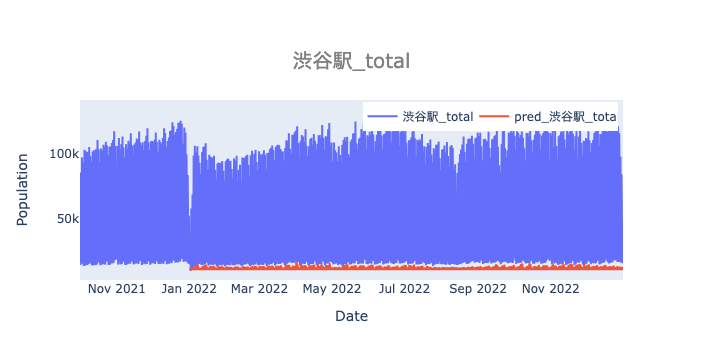

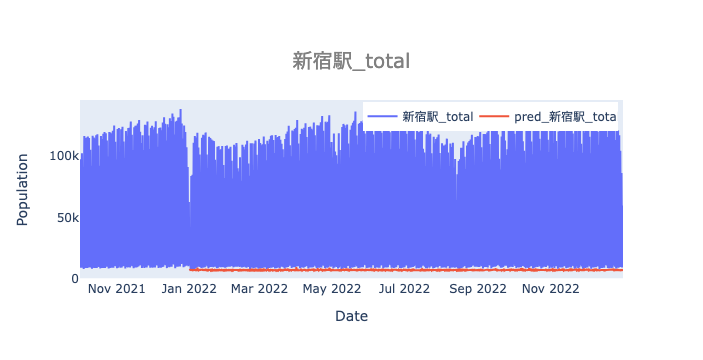

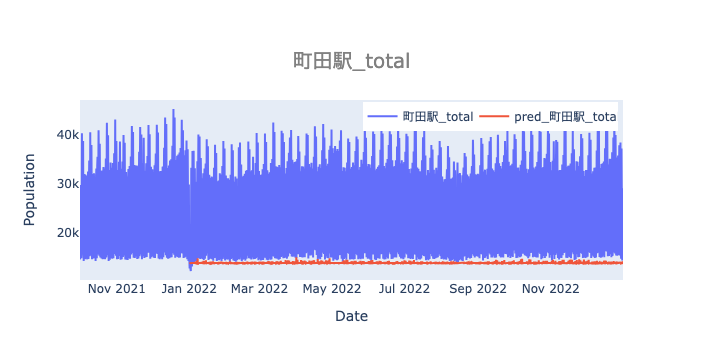

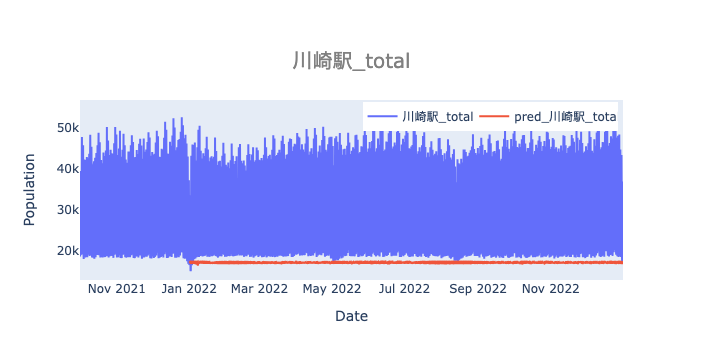

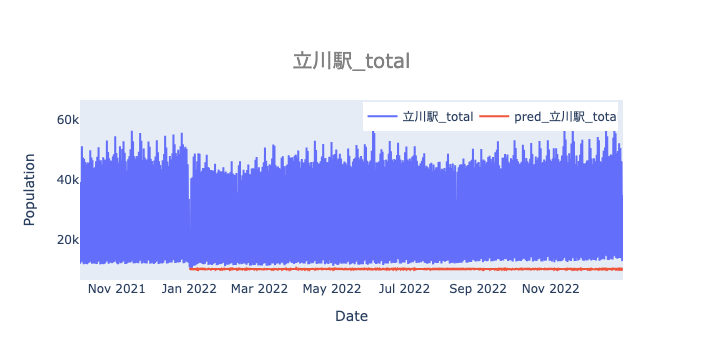

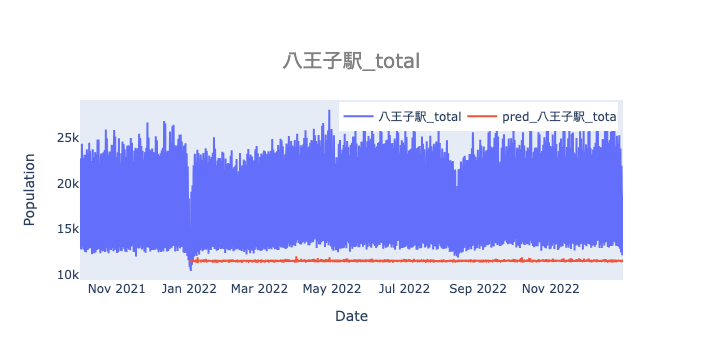

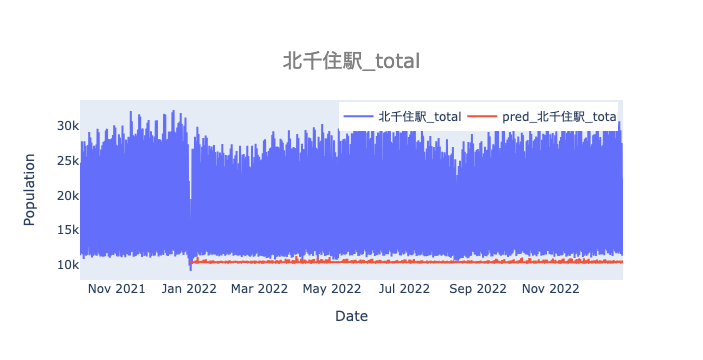

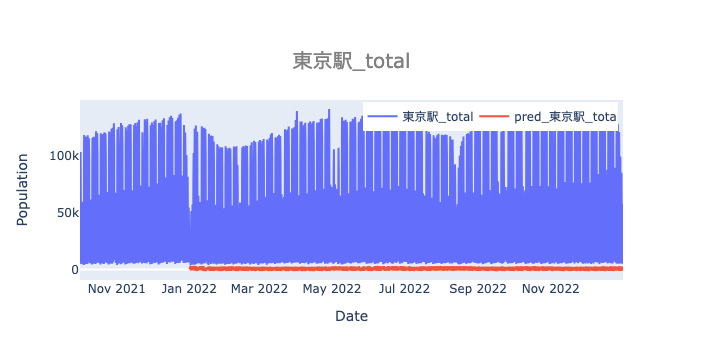

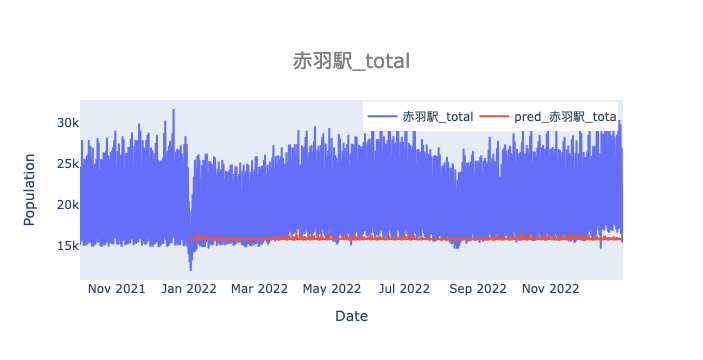

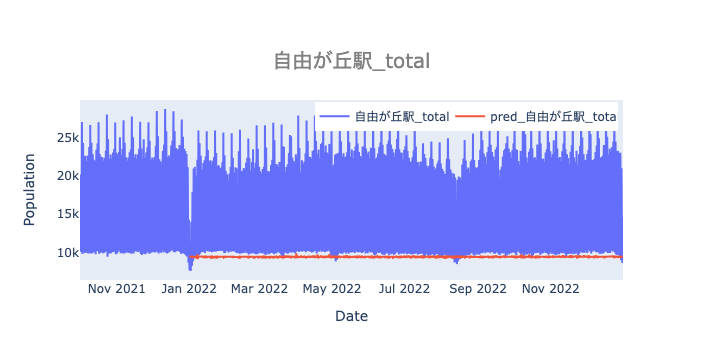

In [20]:
# make y_true df from a specific date
_df_train = df_train.loc['2021-10-01': ,:]
y_true_val = pd.concat([_df_train, df_valid]).iloc[:, :num_features_pred]

plot_population(y_true_val, y_pred_val, flag='plot')

### Calculate RMSE and MAE (benchmark and actual values)

In [21]:
# df setup
num_features_pred = yaml_data['training']['num_features_pred']
df_bench_pred = pd.DataFrame([], columns=df.columns[:num_features_pred])
df_bench_true = pd.DataFrame([], columns=df.columns[:num_features_pred])

# month range and dow lists
bench_range = pd.date_range(start=valid_start, end=valid_end, freq='M')
dow_list = ['dow_Mon','dow_Tue','dow_Wed','dow_Thu','dow_Fri','dow_Sat', 'dow_Sun']

# get data from df_train/df_valid and compute mean
for month in bench_range:
    m = str(int(month.strftime('%m'))) # convert month to the same format as in df
    for dow in dow_list:
        query = f'month_{m} == 1 & {dow} == 1 & official_holiday == 0 & unofficial_holiday == 0' # month, dow, and non-holiday
        df_bench_pred.loc[month.strftime('%Y-%m') + ' ' + dow] = df_train.query(query).iloc[:, :num_features_pred].mean()
        df_bench_true.loc[month.strftime('%Y-%m') + ' ' + dow] = df_valid.query(query).iloc[:, :num_features_pred].mean()

# calculate RMSE and MAE
rmse, mae = {}, {}
for i in range(num_features_pred):
    rmse[df.columns[i][:-6]] = mean_squared_error(df_bench_pred.iloc[:, i], df_bench_true.iloc[:, i], squared=False)
    mae[df.columns[i][:-6]] = mean_absolute_error(df_bench_pred.iloc[:, i], df_bench_true.iloc[:, i])

rmse_ben_actu = pd.Series(rmse)
mae_ben_actu = pd.Series(mae)
print('------------RMSE------------')
print(rmse_ben_actu)
print('Average :', np.mean(rmse_ben_actu))
print('------------MAE-------------')
print(mae_ben_actu)
print('Average :', np.mean(mae_ben_actu))

------------RMSE------------
渋谷駅       5898.432024
新宿駅       7132.208497
町田駅       1735.458467
川崎駅       1281.566516
立川駅       1344.665944
八王子駅       599.872688
北千住駅       599.474177
東京駅      12516.030676
赤羽駅       1230.638393
自由が丘駅      520.135076
dtype: float64
Average : 3285.8482458767517
------------MAE-------------
渋谷駅       4585.718303
新宿駅       5868.629317
町田駅       1513.500622
川崎駅       1059.912795
立川駅        998.997331
八王子駅       489.558102
北千住駅       490.104076
東京駅      10505.060821
赤羽駅        971.272124
自由が丘駅      406.967788
dtype: float64
Average : 2688.9721278064253


### Anomaly detection for each location

In [22]:
def calc_anomaly_scores(matrix_valid, matrix_test):
    '''
    : calculate anomaly scores at each day by quadratic form
    : matrix_valid :  valid data for calculating mean and variance;  numpy matrix
    : matrix_test  :  predicted test data for getting anomaly scores;  numpy matrix
    : return       :  anomaly_scores; numpy array
    '''
    # compute mean and cov inverse
    mean = matrix_valid.mean(axis=0)
    cov_inv = np.matrix(np.cov(matrix_valid, rowvar=False)).getI()

    # apply quadratic formula to each row of matrix
    output = np.zeros(matrix_test.shape[0])
    for i in range(matrix_test.shape[0]):
        output[i] = ((matrix_test[i] - mean) * cov_inv * np.transpose(matrix_test[i] - mean)).item(0)

    return output


def get_anomaly_datetime(anomaly_scores, threshold):
    '''
    : get datetime when anomaly is detected
    : anomaly_scores    :  anomaly scores calculated from df_test;  numpy 1d array
    : threshold         :  threshold; float
    : return            :  anomaly_datetime, anomaly_next_hours; numpy array
    '''    
    # get df.index where anomaly_scores > threshold
    anomaly_datetime = df_test.index[anomaly_scores > threshold]
    print("num of anomaly-detected data", anomaly_datetime.shape[0])

    # get the next datetime when anomaly is detected
    anomaly_next_hours = []
    for date in anomaly_datetime:
        if date.hour == 18:  ##### Need to change manually #####
            anomaly_next_hours.append(date + datetime.timedelta(hours=15))
        else:
            anomaly_next_hours.append(date + datetime.timedelta(hours=3))
    
    return anomaly_datetime, anomaly_next_hours

In [23]:
# predict with test data
pred_test = predict(model = model, dataset = test_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_test = pd.DataFrame(pred_test, columns=df.columns[:num_features_pred], index=df_test.index).add_prefix('pred_')

all_anomaly_datetime = []
all_anomaly_next_hours = []
for i in range(num_features_pred):
    # calculate anomaly score by using validation_data
    diff = df_valid.iloc[:, i].to_numpy() - pred_val[:, i] 
    anomaly_scores = np.abs(diff)
    # set top 1% score as threshold for test_data
    threshold = np.percentile(anomaly_scores, 99)
    print(f'{df.columns[i]} threshold:', threshold)

    # calculate anomaly_score for each location
    diff = df_test.iloc[:, i].to_numpy() - pred_test[:, i]
    anomaly_scores = np.abs(diff)
    # datetime when anomaly is detected
    anomaly_datetime, anomaly_next_hours = get_anomaly_datetime(anomaly_scores, threshold)
    
    all_anomaly_datetime.append(anomaly_datetime)
    all_anomaly_next_hours.append(anomaly_next_hours)
    print()

  0%|          | 0/273 [00:00<?, ?it/s]

渋谷駅_total threshold: 110496.76648437497
num of anomaly-detected data 66

新宿駅_total threshold: 121237.9021533203
num of anomaly-detected data 73

町田駅_total threshold: 26873.99619140625
num of anomaly-detected data 29

川崎駅_total threshold: 32000.268398437493
num of anomaly-detected data 45

立川駅_total threshold: 42041.150273437495
num of anomaly-detected data 20

八王子駅_total threshold: 14444.59818359375
num of anomaly-detected data 36

北千住駅_total threshold: 20037.299287109374
num of anomaly-detected data 73

東京駅_total threshold: 133025.77291992187
num of anomaly-detected data 321

赤羽駅_total threshold: 13237.235468749997
num of anomaly-detected data 85

自由が丘駅_total threshold: 16757.209599609374
num of anomaly-detected data 31



In [ ]:
# make y_true df from a specific date
_df_valid = df_valid.loc['2022-12-01': ,:]
y_true_test = pd.concat([_df_valid, df_test]).iloc[:, :num_features_pred]

# plot
plot_population(y_true_test, y_pred_test, flag='anomaly_detection', 
                anomaly_datetime=all_anomaly_datetime, anomaly_next_hours=all_anomaly_next_hours)

### Anomaly detection for Tokyo

In [ ]:
# predict with test data
pred = predict(model = model, dataset = test_dataset_for_pred, num_features_pred = num_features_pred)
y_pred_test = pd.DataFrame(pred_test, columns=df.columns[:num_features_pred], index=df_test.index).add_prefix('pred_')

# calculate anomaly score by using validation_data
anomaly_scores = calc_anomaly_scores(np.matrix(df_valid.iloc[:,:num_features_pred]), np.matrix(y_pred_val))
# set top 1% score as threshold for test_data
threshold = np.percentile(anomaly_scores, 99)
print('threshold:', threshold)

# calculate anomaly_score for whole Tokyo
anomaly_scores = calc_anomaly_scores(np.matrix(df_valid.iloc[:,:num_features_pred]), np.matrix(y_pred_test)) 
# datetime when anomaly is detected
anomaly_datetime, anomaly_next_hours = get_anomaly_datetime(anomaly_scores, threshold)

In [ ]:
# make y_true df from a specific date
_df_valid = df_valid.loc['2022-12-01': ,:]
y_true_test = pd.concat([_df_valid, df_test]).iloc[:, :num_features_pred]

# plot
plot_population(y_true_test, y_pred_test, flag='anomaly_detection_tokyo', 
                anomaly_datetime=anomaly_datetime, anomaly_next_hours=anomaly_next_hours)

### Save the results and the model

In [24]:
'''
save the model, its loss, and params used
'''
# count the number of files in the directory
path = '/Users/koki/PycharmProjects/MasterThesis/models'

# read parameter data
df1 = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='params')

# set a model name
num = 'model_' + str(df1.shape[0]+1).zfill(2)

# get params used in this file
series = pd.concat([pd.Series(yaml_data['dataset']), pd.Series(yaml_data['model']), pd.Series(yaml_data['training'])])
params = pd.DataFrame(series).T
params.insert(0, "num", num)
params.insert(1, "file_name", "Transformer_ver3")  ###### the name of this file! ######
params.insert(2, "date_of_execution", datetime.datetime.today().strftime("%Y-%m-%d %H:%M"))
params.insert(3, "execution_time", elapsed_time)
params.insert(params.shape[1], "final_train_loss" , math.floor(train_losses[-1]))
params.insert(params.shape[1], "rmse_pred_actu" , math.floor(np.mean(rmse_pre_actu)))
params.insert(params.shape[1], "mae_pred_actu" , math.floor(np.mean(mae_pre_actu)))
params.insert(params.shape[1], "rmse_ben_actu" , math.floor(np.mean(rmse_ben_actu)))
params.insert(params.shape[1], "mae_ben_actu" , math.floor(np.mean(mae_ben_actu)))
df1 = pd.concat([df1, params])

# read loss data
df2 = pd.read_excel('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx', sheet_name='train_losses')
df2 = pd.concat([df2, pd.Series(train_losses, name=num)], axis=1)

# export the data 
with pd.ExcelWriter('/Users/koki/PycharmProjects/MasterThesis/data/results.xlsx') as writer:
    df1.to_excel(writer, sheet_name='params', index=False)
    df2.to_excel(writer, sheet_name='train_losses', index=False)

# save the model
torch.save(model, '/Users/koki/PycharmProjects/MasterThesis/models/' + num + '.pth')

In [ ]:
# notification
# !afplay '/Users/koki/Documents/セレナと一緒/result_message.m4a'

In [ ]:
print("Done!!!")

### Memo

In [ ]:
'''
seq2seqも初期のlstmみたいにダミーを後から線形結合してみる？
positional encodingなど必要かどうかちゃんと検証する必要あり。
もっと時系列予測の論文調べる
リアルタイムに予想するなら、新たな学習データを使ってファインチューニングする？
やっぱりもっとちゃんとtrain,valid,testの分割を考えないと、統計量が違いすぎるかも。


train: 2016/01 – 2021/12 学習
valid: 2022/01 – 2022/12　予測値とベンチマークを比較、予測値と実測値を比較、mseを計算
test: 2023/01 – 2023/09　異常検知

ベンチマーク
 1. trainの1月の曜日ごとの平均を計算（7個の値が出てくる）（祝日等は人流が変わるので抜いて計算）
 2. それをベンチマークから作った1月の予測値とする
 3. 各月について1と2を繰り返す
 
学習用とテスト用でデータセットの作り方を変える
seq_len_src=56の場合
学習用：1期ずつずらしていく
        src: t=1–56, tgt: t=57-64
             t=2-57,      t=58-65
テスト用：1日ずつずらしていく
        src: t=1–56, tgt: t=57-64
             t=9-64,      t=65–72
             
seq_len_src=8の場合
学習用：1期ずつずらしていく
        src: t=1–8, tgt: t=9-16
             t=2-9,      t=10-17
テスト用：1日ずつずらしていく
        src: t=1–8, tgt: t=9-16
             t=9-16,     t=17–24 
             
seq_len_src=28の場合
学習用：1期ずつずらしていく
        src: t=1–28, tgt: t=29-32
             t=2-29,      t=30-33
テスト用：1日ずつずらしていく
        src: t=1–28, tgt: t=29-32
             t=5-32,      t=33–36 
             
[seq2seq]
学習の仕方：
 t=1–8→encoder, t=8,9-15→decoder→t=9-16→loss計算,
 
テストの仕方：
 t=1–8→encoder, t=8→decoder→t=9→decoder→t=10→...→t=15→decoder→t=16

[lstm]
学習の仕方：
 t=1–8→lstm→t=2-9→loss計算,
 
テストの仕方：
 t=1–8→lstm→t=9→lstm→t=10→...→t=16→lstm→t=17

'''

### Questions

In [ ]:
'''
3ヶ月予測は、データセットのtime_stepを3ヶ月に作り直すのか、それとも今のままでただ3ヶ月分予測するだけか。
 - データセットはそのままで、ただ3ヶ月先まで予測すれば良いだけ。
   9/1（t=1,...,8）を入力して9/2（t=9,...,16）を予測したら、次はその予測された9/2（t=9,...,16）を入力して9/3（t=17,...,24）を予測する。
 
lstmの予測はループさせるの？
 - yes
 - 単純なlstmの場合、（t=1,...,8）を入力するとそれぞれの値の一期先（t=2,...,9）を出力するだけなので、やはりループが必要。
　
loss計算を人流だけで行うのは本当に正しい？
 - yes
 - 人流以外を予測するのは理にかなってない。（そうなるとn225も外すべきかも）

異常検知はただ予測値と実測値の差を求めて、それが閾値を超えてたら異常と判断すれば良いの？
 - yes
 - 異常検知の場合validも作る　train:2016-2021, valid:2021-2022, test:2023/01/-2023/09
 - 東京の異常を見るときは、数字を一つにまとめる。（二次形式を作り、validdataの平均分散を用いて計算する。詳しくは写真を参照のこと。）
 - time stepの数を減らす（e.g., 朝昼夕の3期）
 
ベンチマークの作りかたをもっと詳しく
 - 
 
コロナ関連のイベントダミーの作り方（e.g., ワクチン開発された、など）はどう作る。その日以降がずっと1になる？それともその日だけ1？
 - 

validationの使い道
 - 


'''

### Insight

In [ ]:
'''
学習率は0.0001じゃないとダメそう。
バッチが大きいとエポックの進みは早いが学習率を小さくしないと上手くいかず、結果的に収束するまで時間がかかる。
バッチが小さいと学習率は比較的大きくて大丈夫だが、学習が遅い。
'''

### To Do

In [ ]:
'''
コロナダミー作成 done
コロナ関連のイベントダミー作成 done
seq2seq, lstmのコードもいじる done
時間によって変わる経済変数をもっと入れる（犯罪数、ドル円レート）
データを2016-2023に増やす done
3ヶ月くらい予測してmseで比較 done
長期予測と比較できるようにbenchmarkを作り直す done
訓練データ内にある災害などの日を見て、そこが異常検知できてるかどうか見てみる。
予測値を使って異常検知 done
リアルタイムに異常検知できるようにする
学習の実行時間もエクセルに載せたい done
positional encodingを改良
'''